<a href="https://colab.research.google.com/github/LeonardVG/cv-study-01-haarcascade/blob/main/Haar_Cascade.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Haar Cascade

O **Haar Cascade** é um dos métodos mais icônicos de Detecção de Objetos da história da Visão Computacional. Proposto por Paul Viola e Michael Jones em 2001. Apesar do surgimento de redes neurais profundas, ele permanece popular devido à sua extrema eficiência computacional e velocidade em CPUs.


## O Conceito Principal
Diferente das redes neurais modernas que tentam "entender" a imagem pixel a pixel, o Haar Cascade busca por **padrões de contraste** simples, chamados de *Haar Features*.


* **A Lógica:** Ele assume que certos objetos têm padrões universais de luz e sombra.
* **Exemplo:** Em um rosto humano, a região dos olhos é naturalmente mais escura que a região da testa ou das bochechas. O algoritmo detecta essa diferença subtraindo a soma dos pixels da área escura pela soma da área clara.

![Exemplos de Haar Features](https://miro.medium.com/1*XX8WqHo0lyrgZfTTRQ3ESQ.jpeg)
<img src="https://miro.medium.com/v2/resize:fit:1400/1*XFbTIeG91oW9Tj4uXl2yOg.png" width="300">

## A "Cascata" --> Velocidade
O nome "Cascade" (Cascata) vem da forma como o algoritmo decide se uma região é um rosto ou não. Ele funciona como uma série de filtros sequenciais:

 **Estágio 1:** Verifica características muito simples e grosseiras. Se a região não passar aqui, é descartada imediatamente.
 **Estágio 2:** Se passou no primeiro, verifica características um pouco mais detalhadas.
 **Estágio Final:** Apenas regiões que passam por **todos** os estágios (cascata) são consideradas uma detecção positiva.

Isso é chamado de princípio *Fail Fast* (Falhar Rápido): como a maior parte de uma imagem é "fundo" (não-rosto), o algoritmo elimina essas áreas o mais rápido possível para economizar processamento.

##  Entendendo os Parâmetros
Ao utilizar o método `.detectMultiScale()`, ajustamos dois parâmetros cruciais para a precisão:

### `scaleFactor` (Fator de Escala)
Como alguns rostos podem estar perto da câmera (grandes) e outros longe (pequenos), o algoritmo precisa analisar a imagem em vários tamanhos.
* **O que faz:** Especifica o quanto o tamanho da imagem é reduzido em cada escala.
* **Exemplo:** `1.05` reduz a imagem em 5% a cada passo. Isso é mais lento, mas detecta rostos com mais precisão. `1.3` reduz em 30%, sendo mais rápido, mas pode perder rostos pequenos.

### `minNeighbors` (Vizinhos Mínimos)
O algoritmo passa uma janela deslizante pela imagem. Muitas vezes, um mesmo rosto é detectado várias vezes em posições levemente diferentes.
* **O que faz:** Define quantos retângulos vizinhos (sobrepostos) são necessários para confirmar que aquilo é realmente um rosto.
* **Ajuste:** Valores baixos (ex: 1 ou 2) detectam mais rostos, mas aumentam os **Falsos Positivos**. Valores altos (ex: 5 ou 6) são mais rigorosos e garantem maior certeza na detecção.


___


#Implementação

Conectando com o google drive (não é necessário)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


##Importando a imagem com OpenCV

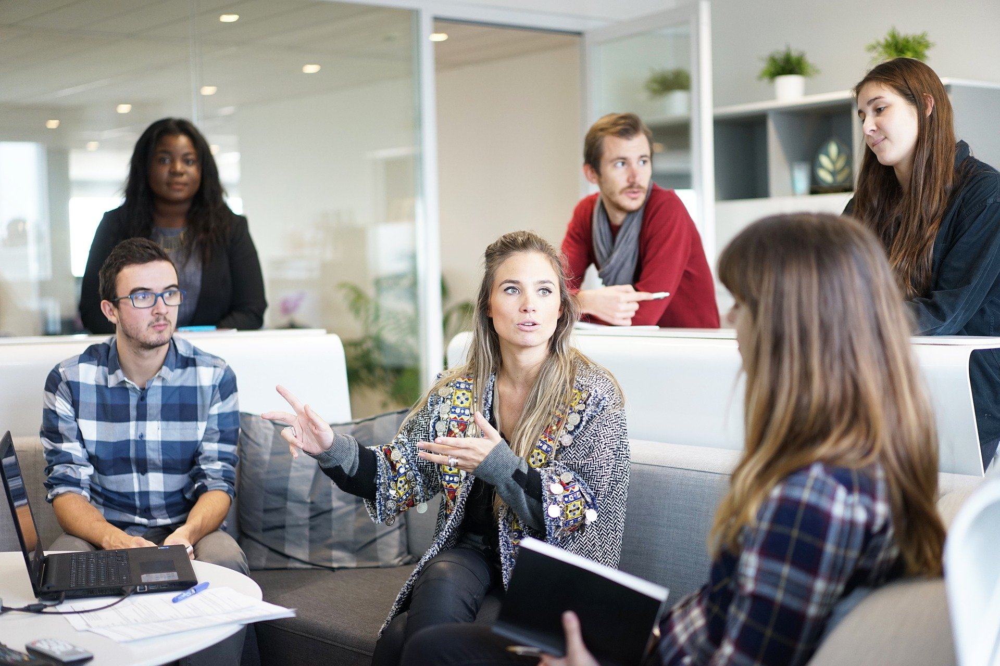

dimensões da imagem:  (1280, 1920, 3)


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

#Importando a imagem --> substitua pelo caminho da sua pasta
imagem = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Images/ImagesCascade/people1.jpg')

cv2_imshow(imagem)

print(f'dimensões da imagem: ', imagem.shape)

##Pré-processamento

Redimensionamento da imagem

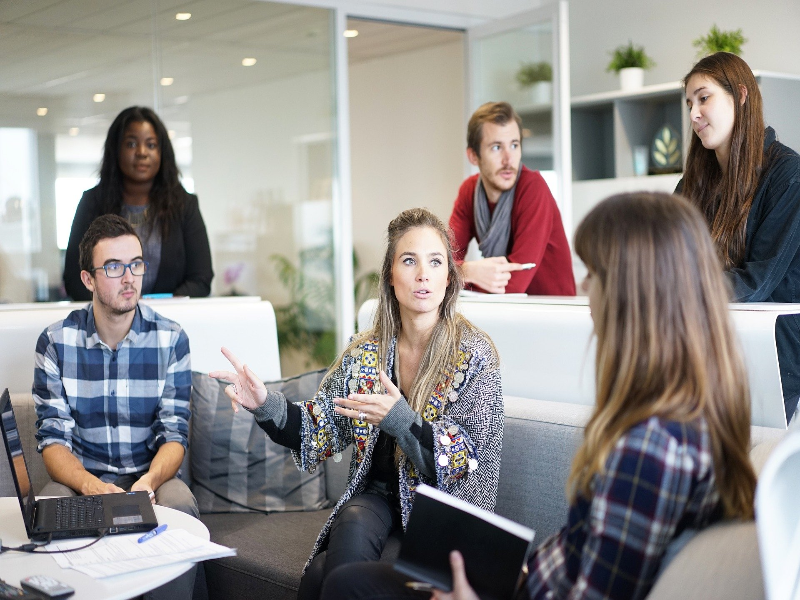

Nova dimensão da imagem:  (600, 800, 3)
Quantidade de pixels = 1440000


In [ ]:
imagem = cv2.resize(imagem, (800,600))
cv2_imshow(imagem)
print(f'Nova dimensão da imagem: ',imagem.shape)
print('Quantidade de pixels = '+ str(imagem.shape[0]*imagem.shape[1]*imagem.shape[2]))

Convertendo para escala de cinza

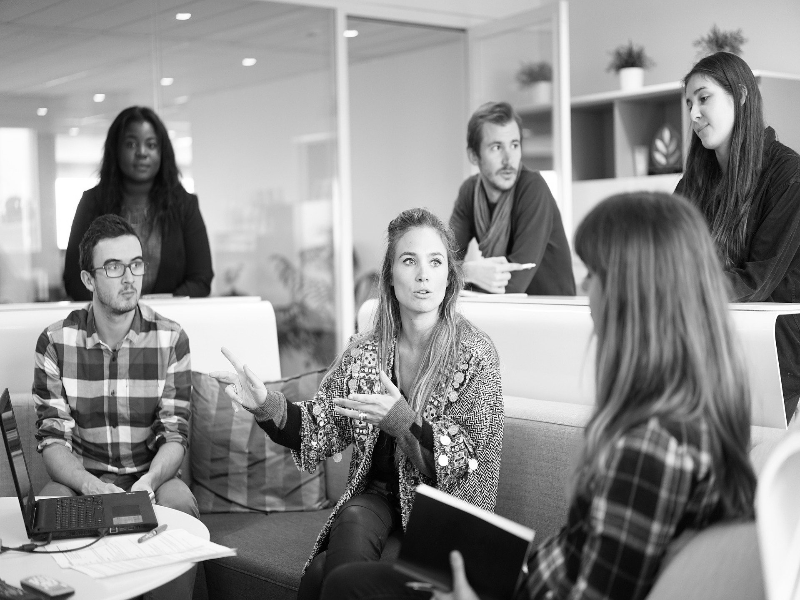

Nova dimensão da imagem:  (600, 800)
Nova quantidade de pixels = 480000


In [ ]:
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
cv2_imshow(imagem_cinza)
print(f'Nova dimensão da imagem: ',imagem_cinza.shape)
print('Nova quantidade de pixels = '+ str(imagem_cinza.shape[0]*imagem_cinza.shape[1]))

##Detecção de Faces com Cascade

In [ ]:
detector_facial = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Cascade/haarcascade_frontalface_default.xml')
deteccoes = detector_facial.detectMultiScale(imagem_cinza)
print('Número de faces detectadas: ' + str(len(deteccoes)))
print(f'Posições das faces [x, y, largura, altura]:\n', deteccoes)

Número de faces detectadas: 6
Posições das faces [x, y, largura, altura]:
 [[677  72  68  68]
 [115 124  53  53]
 [475 123  59  59]
 [387 233  73  73]
 [ 92 239  66  66]
 [390 323  56  56]]


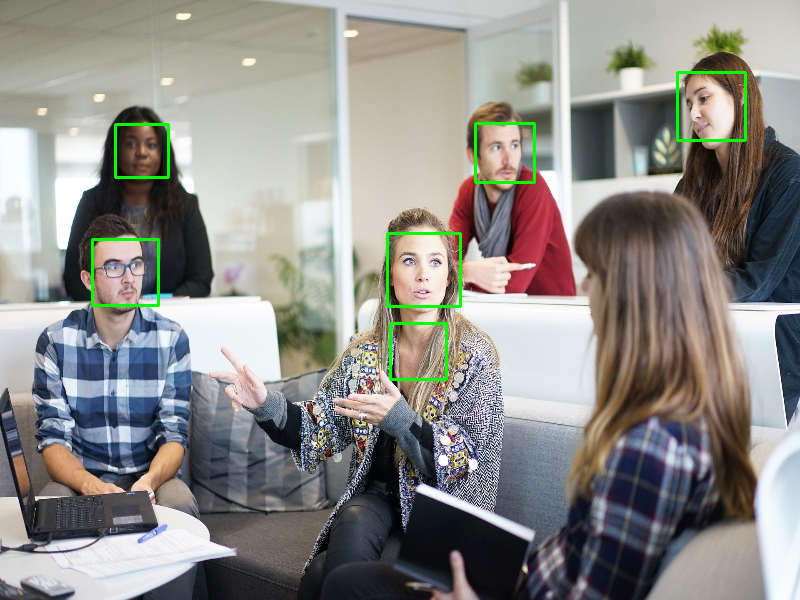

In [ ]:
for x,y,w,h in deteccoes:
  cv2.rectangle(imagem,(x,y),(x+w, y+h), (0,255,0), 2)

cv2_imshow(imagem)

Como podemos ver, temos um falso positivo. Para tentar melhorar isso modificare-mos alguns parâmetros


##Parâmetro `scaleFactor`

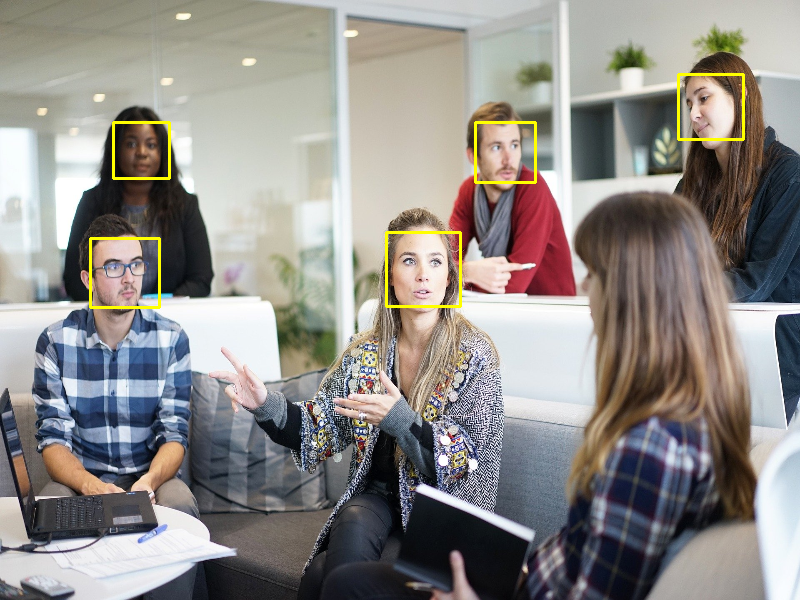

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

imagem = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Images/ImagesCascade/people1.jpg')
imagem = cv2.resize(imagem, (800,600))
img_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Cascade/haarcascade_frontalface_default.xml')
detections = detector.detectMultiScale(img_cinza,scaleFactor = 1.09) #

for (x,y,w,h) in detections:
  cv2.rectangle(imagem,(x,y),(x+w,y+h),(0,255,255),2)

cv2_imshow(imagem)

##Parâmetro `minNeighbors`

Identificar o tamanho mínimo dos retângulos para setar o minSize:"

47 47
47 47
45 45
49 49
49 49
44 44
51 51
52 52
51 51
50 50
47 47
51 51
47 47


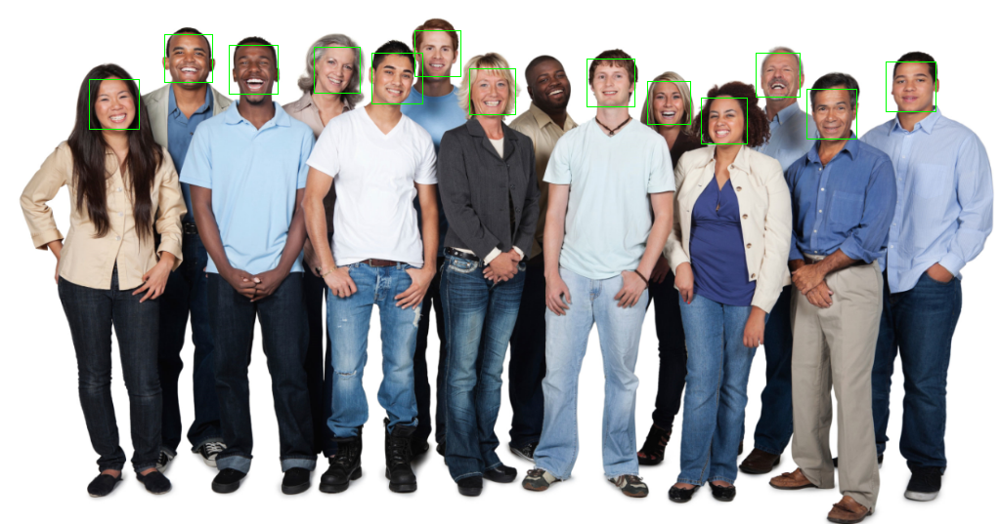

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Images/ImagesCascade/people2.jpg')
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Cascade/haarcascade_frontalface_default.xml')
detections = detector.detectMultiScale(img_gray, scaleFactor=1.2, minNeighbors=3,
                                       minSize=(32,32), maxSize=(100,100))

print('Identificar o tamanho mínimo dos retângulos para setar o minSize:"\n')
for (x,y,w,h) in detections:
  print(w,h)
  cv2.rectangle(img,(x,y),(x+w,y+h),[0,255,0],1)

cv2_imshow(img)

##Detecção de Olhos

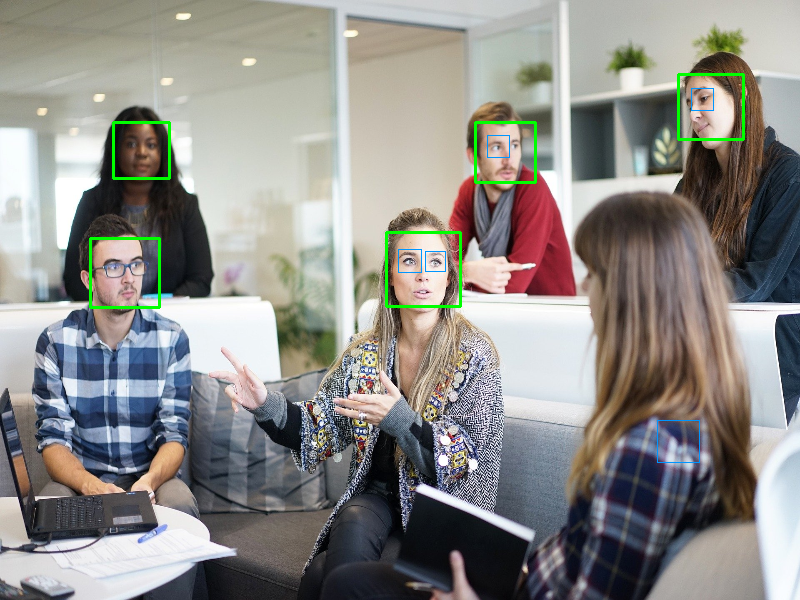

In [ ]:
import cv2
from google.colab.patches import cv2_imshow


imagem = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Images/ImagesCascade/people1.jpg')
imagem = cv2.resize(imagem, (800,600))  #ao redimencionar para esses valores dificulta-se a detecção dos olhos devido a qualidde dessa imagem
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

detector_face = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Cascade/haarcascade_frontalface_default.xml')
detections_faces = detector_face.detectMultiScale(imagem_cinza, scaleFactor=1.09)

detector_olhos = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Cascade/haarcascade_eye.xml')
detections_olhos = detector_olhos.detectMultiScale(imagem_cinza)

#Bouding boxes das faces
for (x,y,w,h) in detections_faces:
  cv2.rectangle(imagem,(x,y),(x+w,y+h),[0,255,0],2)

#Bouding boxes dos olhos
for (x,y,w,h) in detections_olhos:
  cv2.rectangle(imagem,(x,y),(x+w,y+h),[255,150,0],1)


cv2_imshow(imagem)

Uma forma de Otimiza isso é ao invés de analisar a imagem inteira para detectar os olhos, podemos analisar apenas os bounding boxes das faces, eliminando assim também falsos positivos

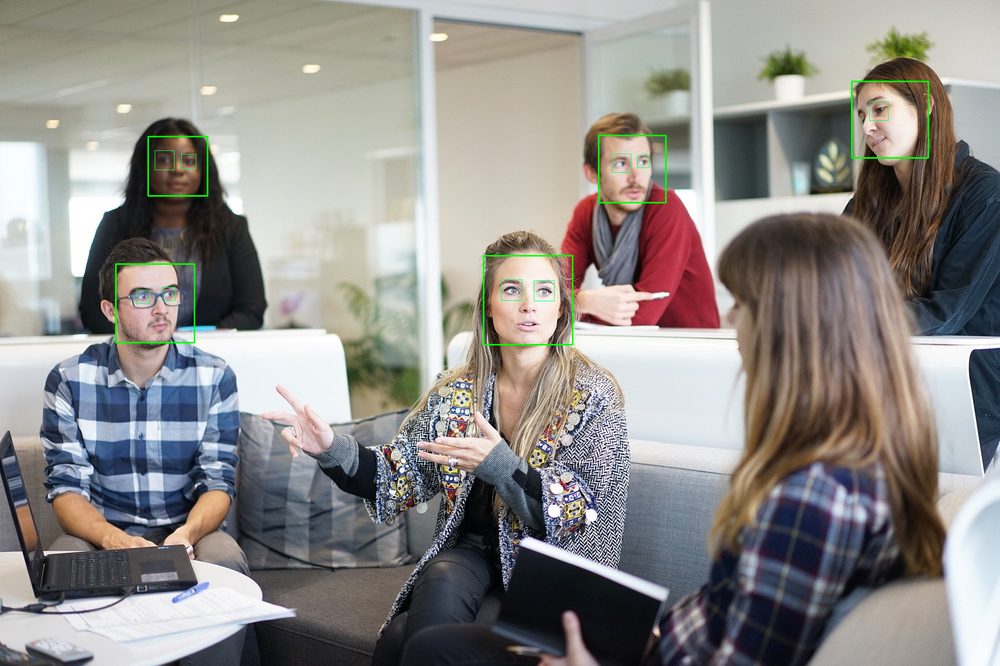

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Images/ImagesCascade/people1.jpg')
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

detector_face = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Cascade/haarcascade_frontalface_default.xml')
detections_faces = detector_face.detectMultiScale(img_gray, scaleFactor=1.3, minSize=(30,30))

detector_olhos = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Cascade/haarcascade_eye.xml')
#detections_olhos = detector_olhos.detectMultiScale(img_gray, scaleFactor=1.09, minNeighbors=10,maxSize=(70,70))


for (x,y,w,h) in detections_faces:
  cv2.rectangle(img,(x,y),(x+w,y+h),[0,255,0],2)

  # Recortar região da face (ROI)
  olho_gray = img_gray[y:y+h, x:x+w]
  olho_color = img[y:y+h, x:x+w]
  detections_olhos = detector_olhos.detectMultiScale(olho_gray,scaleFactor=1.2)

  for (ox,oy,ow,oh) in detections_olhos:
   cv2.rectangle(olho_color,(ox,oy),(ox+ow,oy+oh),[100,255,0],1)

cv2_imshow(img)

array([[[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [ 62,  65,  73],
        ...,
        [114, 109, 111],
        [109, 104, 106],
        [  0, 255,   0]],

       ...,

       [[  0, 255,   0],
        [  0, 255,   0],
        [139, 150, 172],
        ...,
        [245, 250, 249],
        [245, 250, 249],
        [  0, 255,   0]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [140, 153, 175],
        ...,
        [245, 250, 251],
        [244, 248, 249],
        [  0, 255,   0]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]]], dtype=uint8)
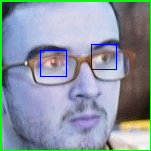

In [ ]:
olho_teste = img[y:y+h, x:x+w]
olho_teste

##Detecção Full Body

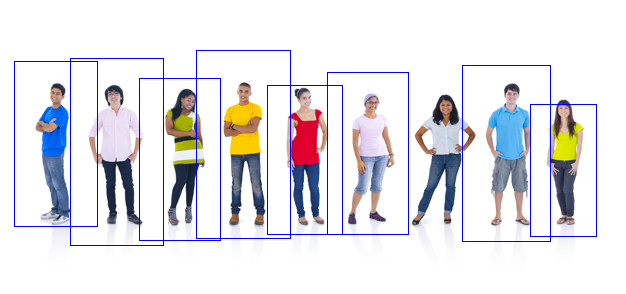

In [44]:
import cv2
from google.colab.patches import cv2_imshow


imagem = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Images/ImagesCascade/people3.jpg')
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

detector_car = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Cascade/fullbody.xml')
detections_cars = detector_car.detectMultiScale(imagem_cinza,scaleFactor=1.05,minSize=(50,50))

#Bouding boxes dos carros
for (x,y,w,h) in detections_cars:
  cv2.rectangle(imagem,(x,y),(x+w,y+h),[255,0,0],1)


cv2_imshow(imagem)

##Detecção de carros


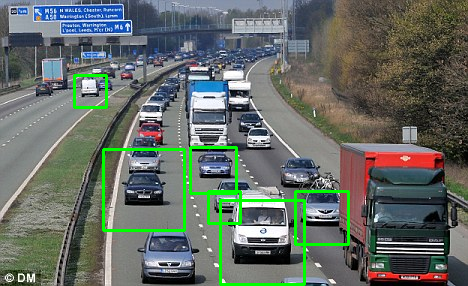

In [38]:
import cv2
from google.colab.patches import cv2_imshow


imagem = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Images/ImagesCascade/car.jpg')
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

detector_car = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Visao_Computacional/Curso-GuiaCompleto/Cascade/cars.xml')
detections_cars = detector_car.detectMultiScale(imagem_cinza,scaleFactor=1.03,minNeighbors=9)

#Bouding boxes dos carros
for (x,y,w,h) in detections_cars:
  cv2.rectangle(imagem,(x,y),(x+w,y+h),[0,255,0],2)


cv2_imshow(imagem)